<h1 align="center">Evaluating Green Cover using Satellite Imagery</h1>

### Importing Libraries:

In [1]:
!pip install visualkeras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.7/993.7 kB 27.5 MB/s eta 0:00:0000:01


In [2]:
# General Imports:
import os
import numpy
import pandas
import matplotlib.pyplot as pyplot
import seaborn
import cv2
from collections import defaultdict
from PIL import ImageFont
import visualkeras
import pickle
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score

2024-02-28 15:57:13.026192: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-28 15:57:13.026288: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-28 15:57:13.156915: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
# Tensorflow:
import tensorflow
import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import backend as K
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler, TensorBoard

### Loading up the Dataset:
Main Dataset folder contains 110 RAW Images, Prepared Dataset folder contains 120 x 120 images processed out from the Main Dataset. We will be utilising the data from Prepared Folder.

In [4]:
data_dir = "/kaggle/input/mumbai-satellite-data/Dataset/Prepared_Dataset"

train_images = "/kaggle/input/mumbai-satellite-data/Dataset/Prepared_Dataset/train_images/"
train_masks = "/kaggle/input/mumbai-satellite-data/Dataset/Prepared_Dataset/train_masks/"

test_images = "/kaggle/input/mumbai-satellite-data/Dataset/Prepared_Dataset/test_images/"
test_masks = "/kaggle/input/mumbai-satellite-data/Dataset/Prepared_Dataset/test_masks/"

val_images = "/kaggle/input/mumbai-satellite-data/Dataset/Prepared_Dataset/val_images/"
val_masks = "/kaggle/input/mumbai-satellite-data/Dataset/Prepared_Dataset/val_masks/"

In [5]:
print("Number of Images in TRAINING SET:", len(os.listdir(train_images + "train")))
print("Number of Mask in TRAINING SET:", len(os.listdir(train_masks + "train")))

print("\nNumber of Images in TEST SET:", len(os.listdir(test_images + "test")))
print("Number of Mask in TEST SET:", len(os.listdir(test_masks + "test")))

print("\nNumber of Images in VALIDATION SET:", len(os.listdir(val_images + "valid")))
print("Number of Masks in VALIDATION SET:", len(os.listdir(val_masks + "valid")))

Number of Images in TRAINING SET: 7128
Number of Mask in TRAINING SET: 7128

Number of Images in TEST SET: 891
Number of Mask in TEST SET: 891

Number of Images in VALIDATION SET: 891
Number of Masks in VALIDATION SET: 891


### Data Visualization:

In [6]:
sample_files = ['tile_1.0_1', 'tile_1.1_1', 'tile_3.7_4', 'tile_3.7_49', 'tile_4.34_74', 'tile_4.35_21', 'tile_5.18_60', 'tile_5.26_80', 'tile_6.10_45']

In [7]:
def show_data(files, images_dir, masks_dir):
    fig, axs = pyplot.subplots(3, 6, figsize=(22, 12), constrained_layout=True)
    seaborn.set_style("ticks")
    fig.suptitle("Training Set Images and Masks\n", fontsize=18, fontweight="medium")
    idx = 0
    
    for i in range(3):
        for j in range(6):
            if j % 2 == 0:
                axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(f'{images_dir}/{files[idx]}.tif'), cv2.COLOR_BGR2RGB),(128, 128)))
                axs[i][j].set_title(f'Satellite Image: {files[idx]}.tif', fontdict = {'fontsize':14, 'fontweight':'medium'})
                axs[i][j].grid(False)
                axs[i][j].axis(True)
            
            elif j % 2 != 0:
                if (files[idx] in ["image_1", "image_2", "image_6"]):
                    axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(f'{masks_dir}/{files[idx]}.tif'), cv2.COLOR_BGR2RGB),(128, 128)))
                    axs[i][j].set_title(f'Ground Truth: {files[idx]}.tif', fontdict = {'fontsize':14, 'fontweight':'medium'})
                    axs[i][j].grid(False)
                    axs[i][j].axis(True)
                    idx += 1
                else:
                    axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(f'{masks_dir}/{files[idx]}.png'), cv2.COLOR_BGR2RGB),(128, 128)))
                    axs[i][j].set_title(f'Ground Truth: {files[idx]}.png', fontdict = {'fontsize':14, 'fontweight':'medium'})
                    axs[i][j].grid(False)
                    axs[i][j].axis(True)
                    idx += 1
    
    pyplot.savefig("/kaggle/working/", facecolor="w", transparent=False, bbox_inches="tight", dpi=300)
    pyplot.show()

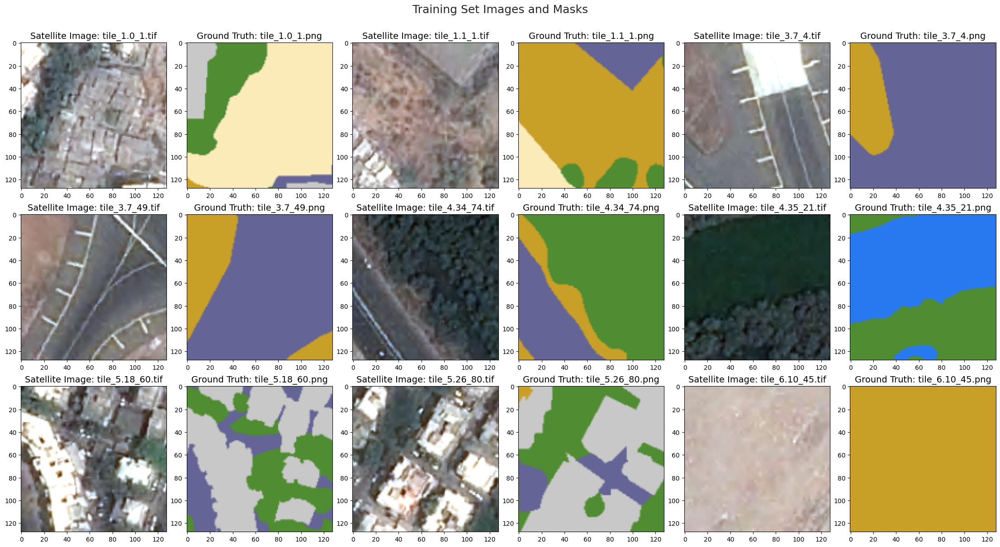

In [8]:
show_data(sample_files, train_images + "train", train_masks + "train")

### Reading RGB Color Codes for Labels:

In [9]:
class_dict_df = pandas.read_csv("/kaggle/input/mumbai-satellite-data/Dataset/Main_Dataset/class_dict.csv", index_col=False, skipinitialspace=True)
class_dict_df

,name,r,g,b
0,Informal Settlements,250,235,185
1,Built-Up,200,200,200
2,Impervious Surfaces,100,100,150
3,Vegetation,80,140,50
4,Barren,200,160,40
5,Water,40,120,240
6,Unlabelled,0,0,0


In [10]:
label_names= list(class_dict_df.name)
label_codes = []

r= numpy.asarray(class_dict_df.r)
g= numpy.asarray(class_dict_df.g)
b= numpy.asarray(class_dict_df.b)

for i in range(len(class_dict_df)):
    label_codes.append(tuple([r[i], g[i], b[i]]))
    
label_codes, label_names

([(250, 235, 185),
  (200, 200, 200),
  (100, 100, 150),
  (80, 140, 50),
  (200, 160, 40),
  (40, 120, 240),
  (0, 0, 0)],
 ['Informal Settlements',
  'Built-Up',
  'Impervious Surfaces',
  'Vegetation',
  'Barren',
  'Water',
  'Unlabelled'])

### One-Hot Encoding RGB Labels and Decoding Encoded Predictions:

In [11]:
code2id = {v:k for k,v in enumerate(label_codes)}
id2code = {k:v for k,v in enumerate(label_codes)}

name2id = {v:k for k,v in enumerate(label_names)}
id2name = {k:v for k,v in enumerate(label_names)}

name2code = {label_names[i]:label_codes[i] for i in range(len(label_names))}

In [12]:
id2code

{0: (250, 235, 185),
 1: (200, 200, 200),
 2: (100, 100, 150),
 3: (80, 140, 50),
 4: (200, 160, 40),
 5: (40, 120, 240),
 6: (0, 0, 0)}

In [13]:
id2name

{0: 'Informal Settlements',
 1: 'Built-Up',
 2: 'Impervious Surfaces',
 3: 'Vegetation',
 4: 'Barren',
 5: 'Water',
 6: 'Unlabelled'}

In [14]:
name2code

{'Informal Settlements': (250, 235, 185),
 'Built-Up': (200, 200, 200),
 'Impervious Surfaces': (100, 100, 150),
 'Vegetation': (80, 140, 50),
 'Barren': (200, 160, 40),
 'Water': (40, 120, 240),
 'Unlabelled': (0, 0, 0)}

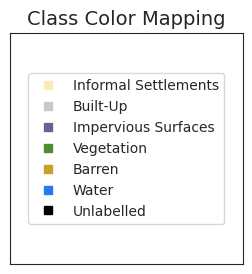

In [15]:
# Create a plot
fig, ax = pyplot.subplots(figsize=(3, 3))

# Plot each class color
for label, color in name2code.items():
    ax.plot([], [], 's', color=[c / 255. for c in color], label=label)

# Add legend
ax.legend(loc='center', fontsize=10)

# Remove ticks and labels
ax.set_xticks([])
ax.set_yticks([])
ax.set_xticklabels([])
ax.set_yticklabels([])

# # Add title
ax.set_title('Class Color Mapping', fontsize=14)
pyplot.show()

In [16]:
def rgb_to_onehot(rgb_image, colormap=id2code):
    num_classes = len(colormap)
    shape = rgb_image.shape[:2] + (num_classes,)
    encoded_image = numpy.zeros(shape, dtype=numpy.int8)
    
    for i, cls in enumerate(colormap):
        encoded_image[:, :, i] = numpy.all(rgb_image.reshape((-1, 3)) == colormap[i], axis=1).reshape(shape[:2])
    
    return encoded_image

In [17]:
def onehot_to_rgb(onehot, colormap=id2code):
    single_layer = numpy.argmax(onehot, axis=-1)
    output = numpy.zeros(onehot.shape[:2] + (3,))
    
    for k in colormap.keys():
        output[single_layer==k] = colormap[k]
    
    return numpy.uint8(output)

## Custom Image Data Generators:

In [18]:
# Normalizing only frame images, since masks contain label info
data_gen_args = dict(rescale=1./255)
mask_gen_args = dict()

train_frames_datagen = ImageDataGenerator(**data_gen_args)
train_masks_datagen = ImageDataGenerator(**mask_gen_args)
val_frames_datagen = ImageDataGenerator(**data_gen_args)
val_masks_datagen = ImageDataGenerator(**mask_gen_args)
test_frames_datagen = ImageDataGenerator(**data_gen_args)
test_masks_datagen = ImageDataGenerator(**mask_gen_args)

# Seed defined for aligning images and their masks
seed = 1

In [19]:
def TrainAugmentGenerator(train_images_dir, train_masks_dir, seed=1, batch_size=8, target_size=(512, 512)):
    train_image_generator = train_frames_datagen.flow_from_directory(
        train_images_dir,
        batch_size=batch_size,
        seed=seed,
        target_size=target_size,
#         class_mode=None
    )
    
    train_mask_generator = train_masks_datagen.flow_from_directory(
        train_masks_dir,
        batch_size=batch_size,
        seed=seed,
        target_size=target_size
    )
    
    while True:
        X1_i = train_image_generator.next()
        X2_i = train_mask_generator.next()
        
        # One Hot Encoding RGB Images:
        mask_encoded = [rgb_to_onehot(X2_i[0][x, :, :, :], id2code) for x in range(X2_i[0].shape[0])]
        
        yield X1_i[0], numpy.asarray(mask_encoded)

In [20]:
def ValAugmentGenerator(val_images_dir, val_masks_dir, seed=1, batch_size=8, target_size=(512, 512)):
    val_image_generator = val_frames_datagen.flow_from_directory(
        val_images_dir,
        batch_size=batch_size,
        seed=seed,
        target_size=target_size,
#         class_mode=None
    )
    
    val_mask_generator = val_masks_datagen.flow_from_directory(
        val_masks_dir,
        batch_size=batch_size,
        seed=seed,
        target_size=target_size
    )
    
    while True:
        X1_i = val_image_generator.next()
        X2_i = val_mask_generator.next()
        
        # One-Hot Encoding RGB Images:
        mask_encoded = [rgb_to_onehot(X2_i[0][x, :, :, :], id2code) for x in range(X2_i[0].shape[0])]
        
        yield X1_i[0], numpy.asarray(mask_encoded)

In [21]:
def TestAugmentGenerator(test_images_dir, test_masks_dir, seed=1, batch_size=8, target_size=(512, 512)):
    test_image_generator = test_frames_datagen.flow_from_directory(
        test_images_dir,
        batch_size=batch_size,
        seed=seed,
        target_size=target_size
    )
    
    test_mask_generator = test_masks_datagen.flow_from_directory(
        test_masks_dir,
        batch_size=batch_size,
        seed=seed,
        target_size=target_size
    )
    
    while True:
        X1_i = test_image_generator.next()
        X2_i = test_mask_generator.next()
        
        # One-Hot Encoding RGB Images:
        mask_encoded = [rgb_to_onehot(X2_i[0][x, :, :, :], id2code) for x in range(X2_i[0].shape[0])]
        
        yield X1_i[0], numpy.asarray(mask_encoded)

# Modelling: VGG16 Encoder based UNet:

In [22]:
batch_size = 32
num_train_samples = len(numpy.sort(os.listdir(train_images + "train")))
num_val_samples = len(numpy.sort(os.listdir(val_images + "valid")))
steps_per_epoch = numpy.ceil(float(num_train_samples) / float(batch_size))
print("steps_per_epoch: ", steps_per_epoch)
validation_steps = numpy.ceil(float(num_val_samples) / (float(batch_size)))
print("validation_steps: ", validation_steps)

steps_per_epoch:  223.0
validation_steps:  28.0


In [23]:
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    return x

In [24]:
def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    
    return x

In [25]:
def build_vgg16_unet(input_shape, num_classes):
    # Input:
    inputs = keras.Input(input_shape)
    
    # Pre-Trained VGG16 Model:
    vgg16 = VGG16(include_top=False, weights="imagenet", input_tensor=inputs)
    
    # Encoder:
    s1 = vgg16.get_layer("block1_conv2").output
    s2 = vgg16.get_layer("block2_conv2").output
    s3 = vgg16.get_layer("block3_conv3").output
    s4 = vgg16.get_layer("block4_conv3").output
    
    # Bridge:
    b1 = vgg16.get_layer("block5_conv3").output
    
    # Decoder:
    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)
    
    # Dropout:
    x1 = Dropout(0.4)(d4)
    
    # Output:
    outputs = Conv2D(num_classes, 1, padding="same", activation="softmax")(d4)
    
    model = Model(inputs, outputs, name="VGG16_UNet")
    
    return model

In [26]:
def dice_coef(y_true, y_pred):
    return (2. * K.sum(y_true * y_pred) + 1.) / (K.sum(y_true) + K.sum(y_pred) + 1.)

In [27]:
def class_accuracy(confusion: numpy.ndarray) -> numpy.ndarray:
    """
    Return the per class accuracy from confusion matrix.
    Args:
        confusion: the confusion matrix between ground truth and predictions
    Returns:
        a vector representing the per class accuracy
    """
    # extract the number of correct guesses from the diagonal
    preds_correct = numpy.sum(confusion * numpy.eye(len(confusion)), axis=-1)
    # extract the number of total values per class from ground truth
    trues = numpy.sum(confusion, axis=-1)
    # get per class accuracy by dividing correct by total
    return preds_correct / trues

In [28]:
def iou(confusion: numpy.ndarray) -> numpy.ndarray:
    """
    Return the per class Intersection over Union (I/U) from confusion matrix.
    Args:
        confusion: the confusion matrix between ground truth and predictions
    Returns:
        a vector representing the per class I/U
    Reference:
        https://en.wikipedia.org/wiki/Jaccard_index
    """
    # get |intersection| (AND) from the diagonal of the confusion matrix
    intersection = (confusion * numpy.eye(len(confusion))).sum(axis=-1)
    # calculate the total ground truths and predictions per class
    preds = confusion.sum(axis=0)
    trues = confusion.sum(axis=-1)
    # get |union| (OR) from the predictions, ground truths, and intersection
    union = trues + preds - intersection
    # return the intersection over the union
    return intersection / union

In [29]:
K.clear_session()

loss = tensorflow.keras.losses.CategoricalCrossentropy()
vgg16_unet = build_vgg16_unet(input_shape = (128, 128, 3), num_classes = 7)
vgg16_unet.compile(optimizer=Adam(learning_rate = 0.0001), loss=loss, metrics=[dice_coef, "accuracy"])
vgg16_unet.summary()

58889256/58889256 [==============================] - 2s 0us/step
Model: "VGG16_UNet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 128, 128, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 block1_conv2 (Conv2D)       (None, 128, 128, 64)         36928     ['block1_conv1[0][0]']        
                                                                                                  
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)           0         ['block1_conv2[0][0]']        
                        

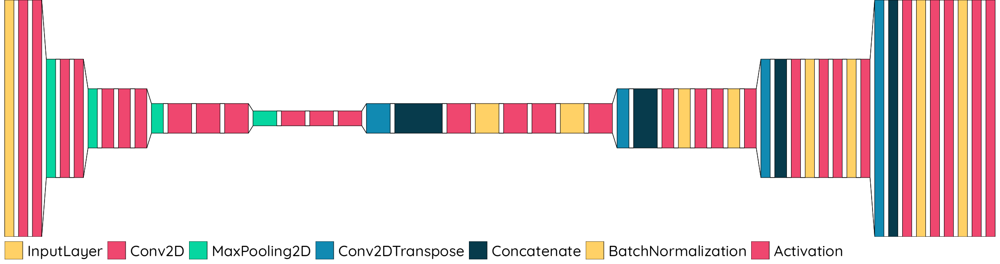

In [30]:
color_map = defaultdict(dict)
color_map[Dropout]["fill"] = "gray"

font = ImageFont.truetype("/kaggle/input/quicksand/Quicksand-Medium.ttf", 32)
visualkeras.layered_view(vgg16_unet, legend=True, font=font, to_file="/kaggle/working/vgg16_unet_architecture.png", color_map=color_map, draw_volume=False)

### Training:

In [31]:
def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 ** (epoch / s)
    return exponential_decay_fn

In [32]:
exponential_decay_fn = exponential_decay(0.0001, 40)

In [33]:
lr_schedular = LearningRateScheduler(
    exponential_decay_fn,
    verbose=1
)

In [34]:
checkpoint = ModelCheckpoint(
    filepath="/kaggle/working/vgg16_unet.h5",
    save_best_only=True,
    monitor="val_loss",
    mode="auto",
    verbose=1
)

csvlogger = CSVLogger(
    filename="/kaggle/working/vgg16_unet_training.csv",
    separator=",",
    append=False
)

callbacks = [checkpoint, csvlogger, lr_schedular]

In [35]:
history = vgg16_unet.fit(
    TrainAugmentGenerator(train_images_dir = train_images, train_masks_dir = train_masks, target_size = (128, 128)), 
    steps_per_epoch = steps_per_epoch,
    validation_data = ValAugmentGenerator(val_images_dir = val_images, val_masks_dir = val_masks, target_size = (128, 128)), 
    validation_steps = validation_steps, 
    epochs = 50,
    callbacks = callbacks,
    use_multiprocessing = False,
    verbose = 1
)

Found 7128 images belonging to 1 classes.
Found 7128 images belonging to 1 classes.

Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/50


I0000 00:00:1709135892.660006     106 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


223/223 [==============================] - ETA: 0s - loss: 1.0654 - dice_coef: 0.4680 - accuracy: 0.6258Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.

Epoch 1: val_loss improved from inf to 0.75613, saving model to /kaggle/working/vgg16_unet.h5


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


223/223 [==============================] - 57s 187ms/step - loss: 1.0654 - dice_coef: 0.4680 - accuracy: 0.6258 - val_loss: 0.7561 - val_dice_coef: 0.5860 - val_accuracy: 0.7071 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.440608762859235e-05.
Epoch 2/50
223/223 [==============================] - ETA: 0s - loss: 0.7422 - dice_coef: 0.6068 - accuracy: 0.7532
Epoch 2: val_loss improved from 0.75613 to 0.54981, saving model to /kaggle/working/vgg16_unet.h5
223/223 [==============================] - 40s 180ms/step - loss: 0.7422 - dice_coef: 0.6068 - accuracy: 0.7532 - val_loss: 0.5498 - val_dice_coef: 0.6887 - val_accuracy: 0.8243 - lr: 9.4406e-05

Epoch 3: LearningRateScheduler setting learning rate to 8.912509381337456e-05.
Epoch 3/50
223/223 [==============================] - ETA: 0s - loss: 0.7193 - dice_coef: 0.6209 - accuracy: 0.7570
Epoch 3: val_loss did not improve from 0.54981
223/223 [==============================] - 39s 177ms/step - loss: 0.7193 

In [36]:
with open("/kaggle/working/vgg16_unet_1.h5", "wb") as file_pi:
    pickle.dump(history.history, file_pi)

In [37]:
file_pi.close()

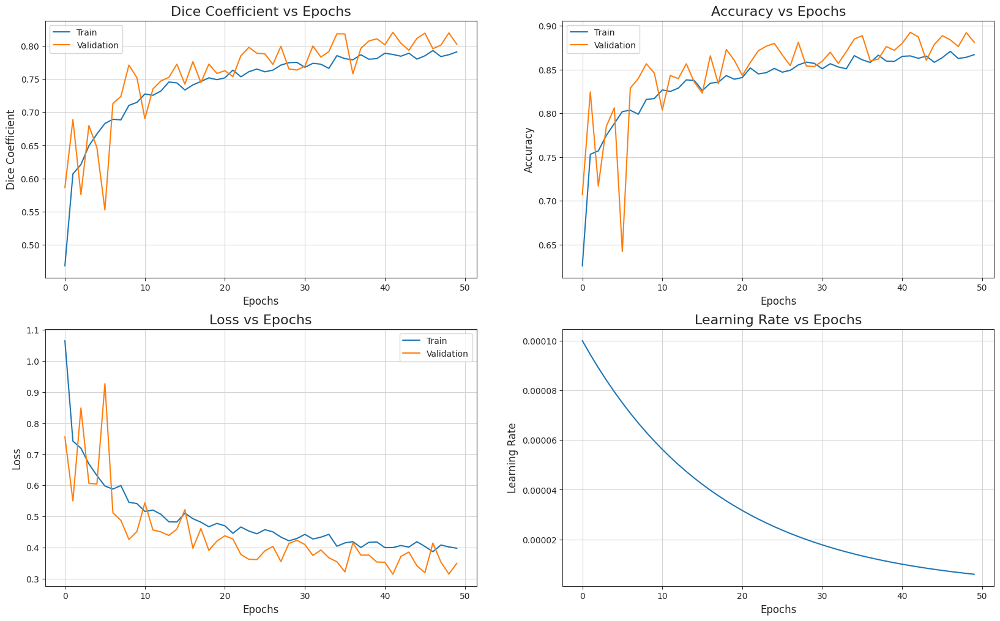

In [38]:
fig, ax = pyplot.subplots(2, 2, figsize=(20, 12))
ax = ax.ravel()
seaborn.set_style("ticks")
metrics = ['Dice Coefficient', 'Accuracy', 'Loss', 'Learning Rate']

for i, met in enumerate(['dice_coef', 'accuracy', 'loss', 'lr']): 
    if met != 'lr':
        ax[i].plot(history.history[met], '-')
        ax[i].plot(history.history['val_' + met], '-')
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs', fontsize=12)
        ax[i].set_ylabel(metrics[i], fontsize=12)
        ax[i].legend(['Train', 'Validation'])
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
    else:
        ax[i].plot(history.history[met], '-')
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs', fontsize=12)
        ax[i].set_ylabel(metrics[i], fontsize=12)
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        
pyplot.savefig("/kaggle/working/vgg16_unet_metrics_plot.png", facecolor= 'w',transparent= False, bbox_inches= 'tight', dpi= 300)
pyplot.show()

### Evaluating VGG16-UNet on Test Set:

In [39]:
testing_gen = TestAugmentGenerator(test_images_dir = test_images, test_masks_dir = test_masks, batch_size = 32, target_size = (128, 128))
vgg16_unet.load_weights("/kaggle/working/vgg16_unet.h5")
vgg16_unet_eval = vgg16_unet.evaluate(testing_gen, steps=21, return_dict=True)

Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
21/21 [==============================] - 21s 733ms/step - loss: 1.7506 - dice_coef: 0.5764 - accuracy: 0.5984


In [40]:
scores = {
    'deeplabv3plus': {},
    'vgg16_unet': {},
    'mobilenetv2_unet' : {}
}
scores['vgg16_unet'] = vgg16_unet_eval

In [41]:
Y_true_all_2, y_pred_all_2 = numpy.array([]), numpy.array([])
count = 0

for i in range(21):
    batch_img, batch_mask = next(testing_gen)
    pred_all= vgg16_unet.predict(batch_img)
    
    for j in range(0, numpy.shape(pred_all)[0]):
        count += 1
        true_msk = batch_mask[j]
        pred_msk = pred_all[j]
        Y_true = numpy.argmax(true_msk, axis=-1) # Convert one-hot to index
        y_pred = numpy.argmax(pred_msk, axis=-1) # Convert one-hot to index

        Y_true_flat = Y_true.flatten()
        y_pred_flat = y_pred.flatten()
            
        Y_true_all_2 = numpy.append(Y_true_all_2, Y_true_flat)
        y_pred_all_2 = numpy.append(y_pred_all_2, y_pred_flat)

1/1 [==============================] - 0s 20ms/step


In [42]:
print(Y_true_all_2.shape, y_pred_all_2.shape)

(10928128,) (10928128,)


In [43]:
print(classification_report(Y_true_all_2, y_pred_all_2))

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         0.0       0.99      0.06      0.12   1150546
         1.0       0.81      0.07      0.12    869366
         2.0       0.30      0.49      0.37   1731271
         3.0       0.92      0.76      0.83   2166564
         4.0       0.37      0.29      0.32   1939606
         5.0       0.66      1.00      0.79   3070750
         6.0       0.00      0.00      0.00        25

    accuracy                           0.57  10928128
   macro avg       0.58      0.38      0.37  10928128
weighted avg       0.65      0.57      0.53  10928128



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [44]:
print('Accuracy:', accuracy_score(Y_true_all_2, y_pred_all_2))
print('Precision:', precision_score(Y_true_all_2, y_pred_all_2, average='weighted'))
print('Recall:', recall_score(Y_true_all_2, y_pred_all_2, average='weighted'))
print('F1 Score:', f1_score(Y_true_all_2, y_pred_all_2, average='weighted'))

Accuracy: 0.570958539285045


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.6501102819032745
Recall: 0.570958539285045
F1 Score: 0.5260973741419428


In [45]:
print('Class-wise F1 Score\n', f1_score(Y_true_all_2, y_pred_all_2, average=None))

Class-wise F1 Score
 [0.11933607 0.12065319 0.36757444 0.8329598  0.32465129 0.79340187
 0.        ]


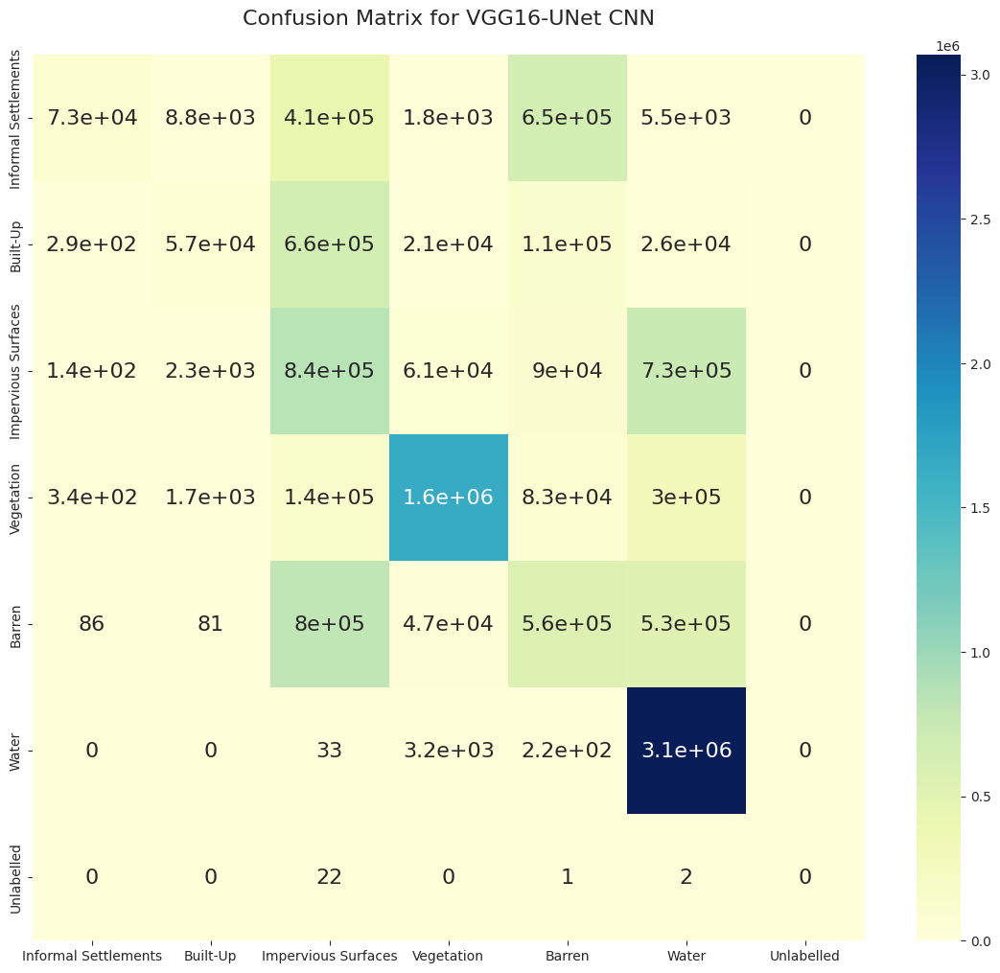

In [46]:
cm_2 = confusion_matrix(Y_true_all_2, y_pred_all_2)
df_cm_2 = pandas.DataFrame(cm_2, label_names, label_names)
fig, ax = pyplot.subplots(figsize=(14,12))
seaborn.heatmap(df_cm_2, annot=True, annot_kws={"size": 16}, cmap=pyplot.cm.YlGnBu)
pyplot.title('Confusion Matrix for VGG16-UNet CNN\n', fontsize=16)
pyplot.savefig('/kaggle/working/confusion_matrix_2.png', transparent= False, bbox_inches= 'tight', dpi= 300)
pyplot.show()

In [47]:
per_class_acc_2 = class_accuracy(cm_2)
per_class_acc_2

array([0.06350116, 0.06515208, 0.48723972, 0.75820977, 0.28678917,
       0.99887454, 0.        ])

In [48]:
vgg16_unet_class_acc = pandas.DataFrame(zip(label_names, per_class_acc_2[:6].T), columns=['Class', 'Accuracy'])
vgg16_unet_class_acc['F1'] = f1_score(Y_true_all_2, y_pred_all_2, average=None)[:6]
vgg16_unet_class_acc

,Class,Accuracy,F1
0,Informal Settlements,0.063501,0.119336
1,Built-Up,0.065152,0.120653
2,Impervious Surfaces,0.487240,0.367574
3,Vegetation,0.758210,0.832960
4,Barren,0.286789,0.324651
5,Water,0.998875,0.793402


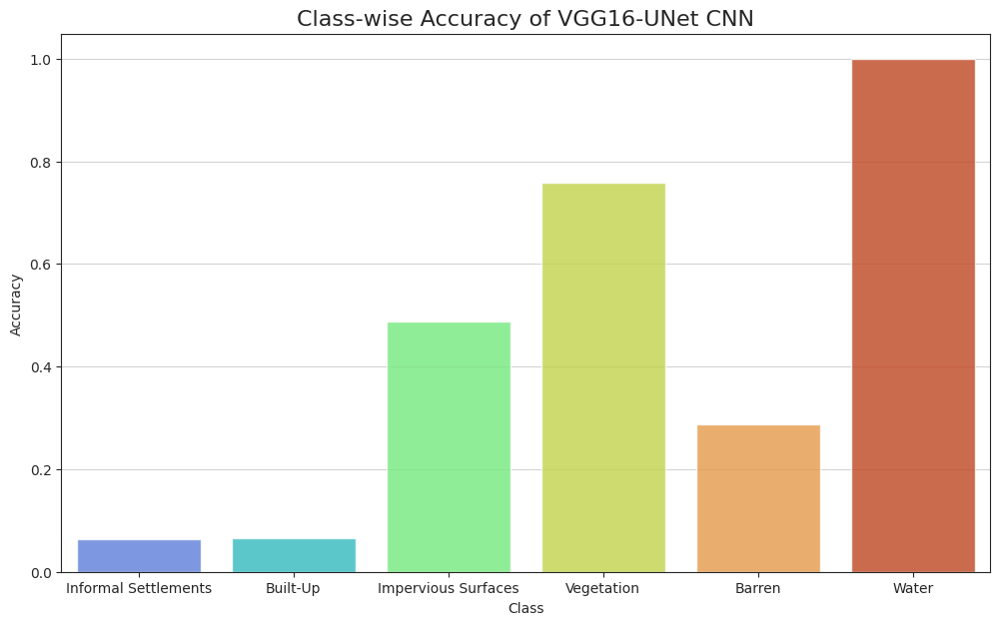

In [49]:
pyplot.figure(figsize=(12, 7))
pyplot.title('Class-wise Accuracy of VGG16-UNet CNN', fontsize=16)
seaborn.set_style("ticks")
seaborn.barplot(x="Class", y="Accuracy", data=vgg16_unet_class_acc, palette='turbo', alpha = 0.8)
pyplot.grid(axis='y', color = 'lightgray', linestyle='-', linewidth=0.8)
pyplot.savefig('/kaggle/working/vgg16_unet_class_acc', facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 300)
pyplot.show()

### Predictions on Test Set using VGG16 + UNet:

In [50]:
!mkdir /kaggle/working/vgg16_unet_pred

1/1 [==============================] - 0s 27ms/step


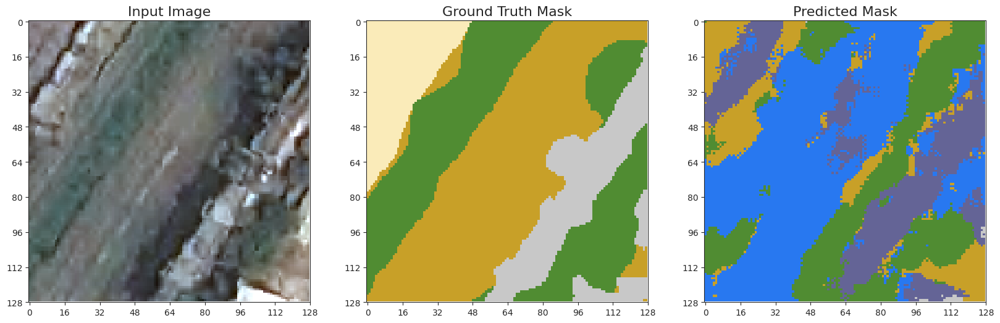

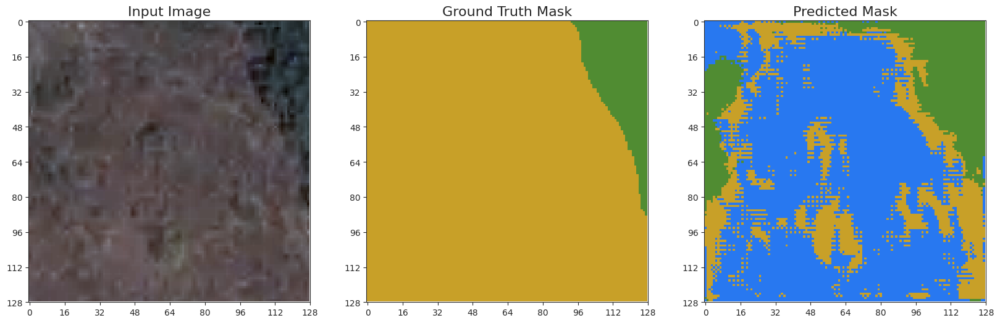

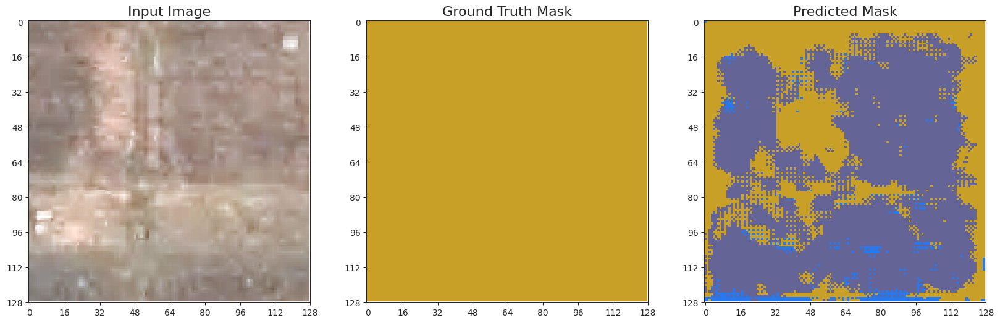

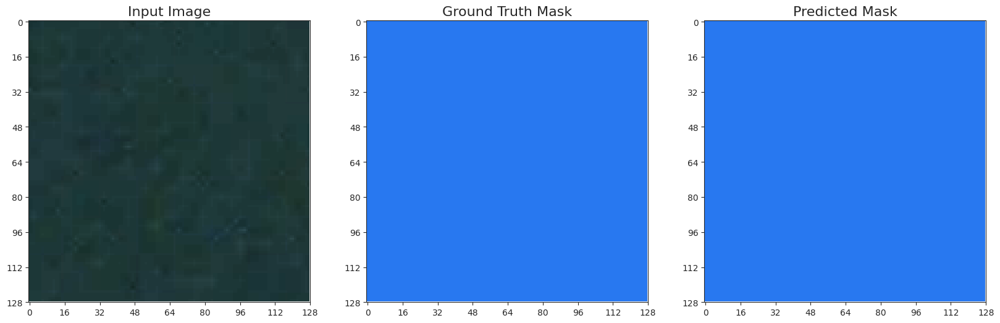

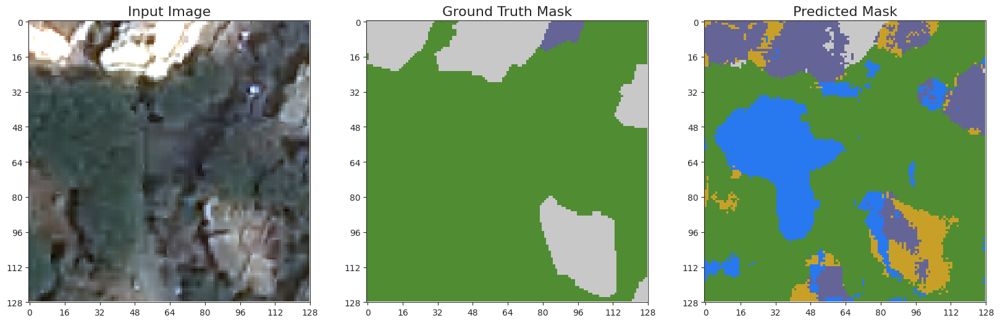

...

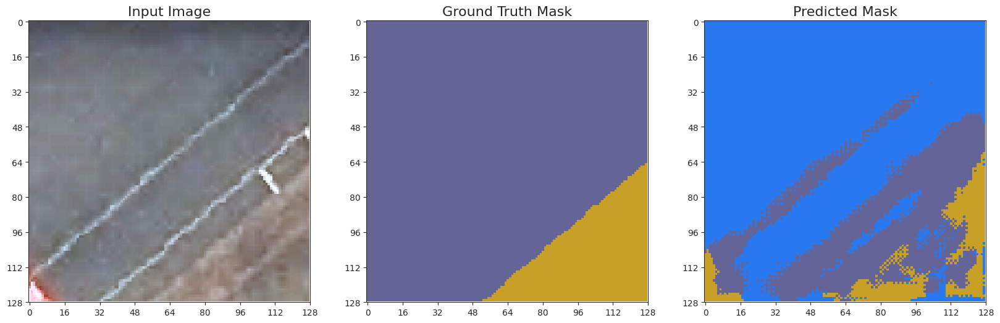

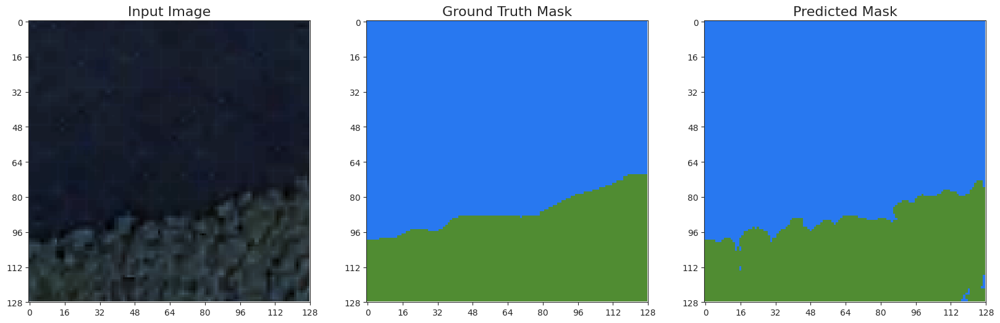

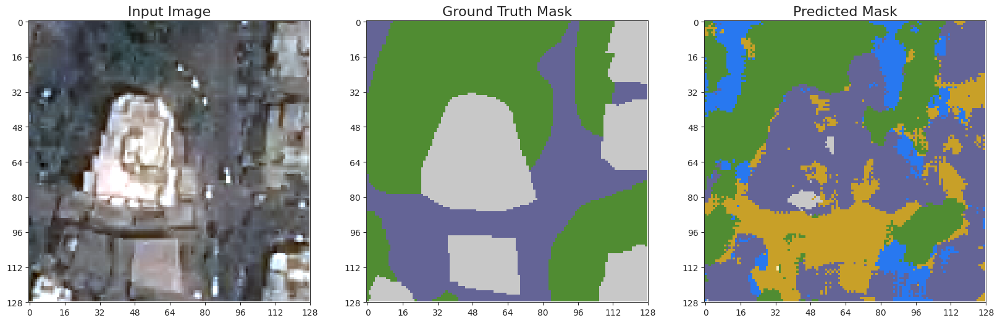

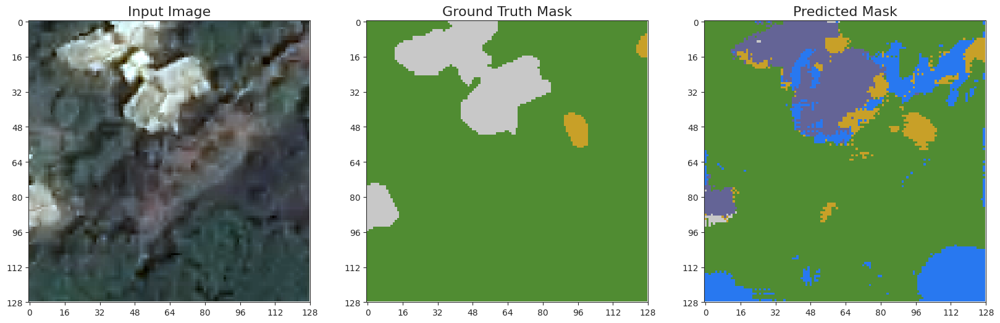

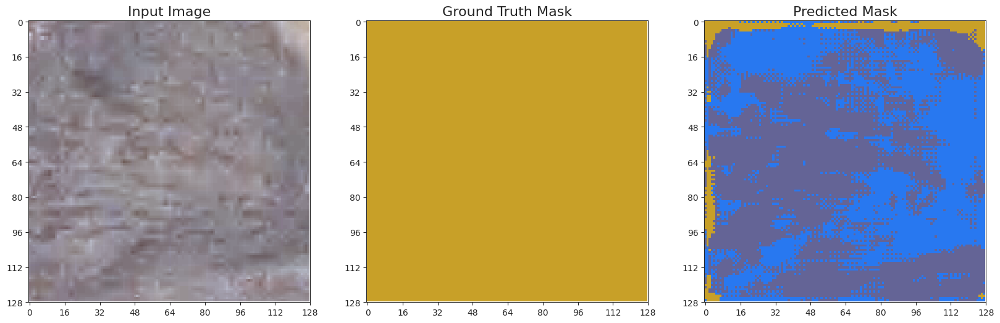

1/1 [==============================] - 0s 25ms/step


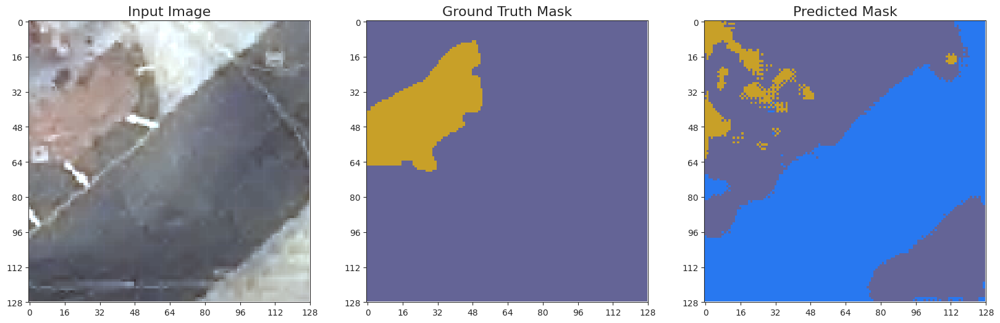

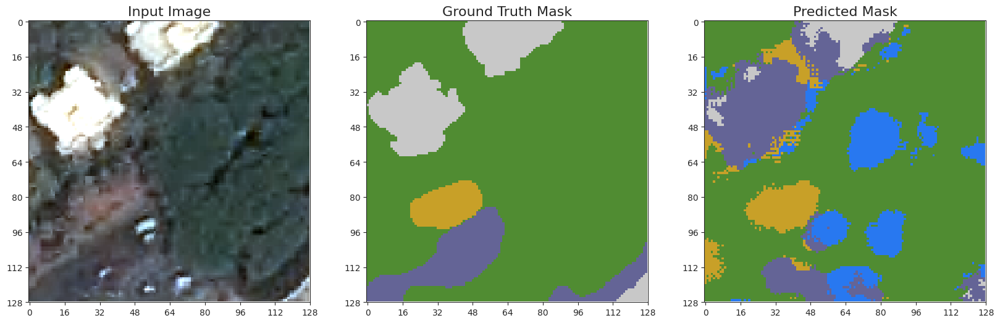

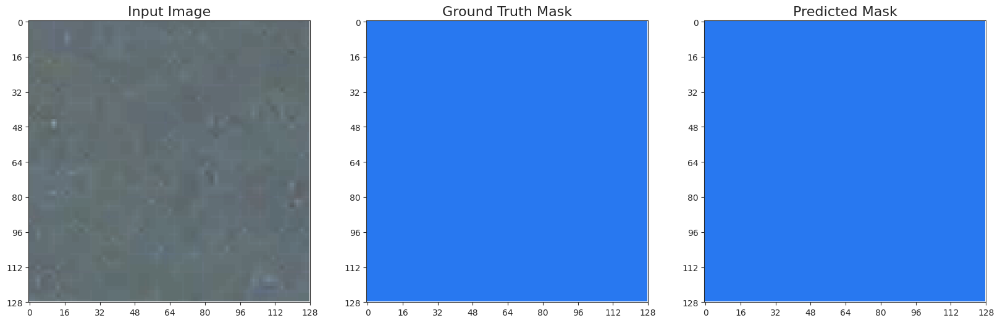

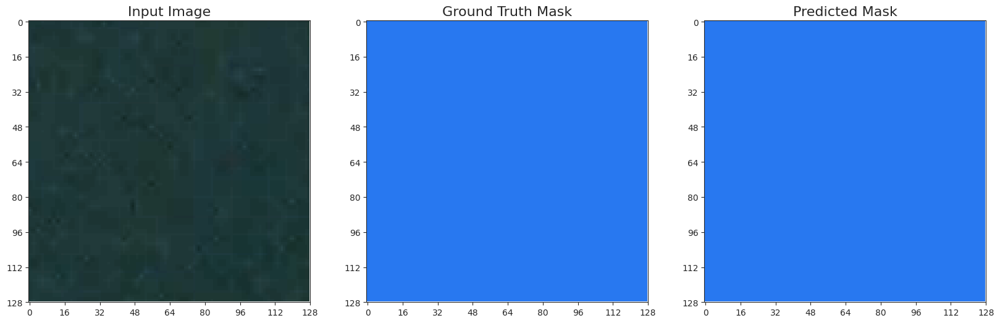

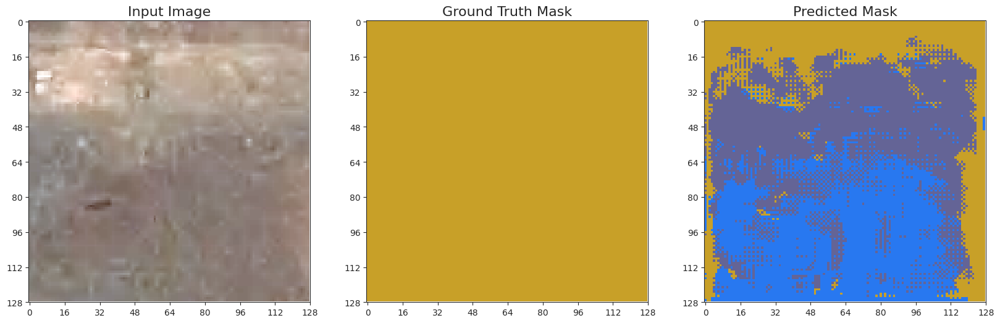

...

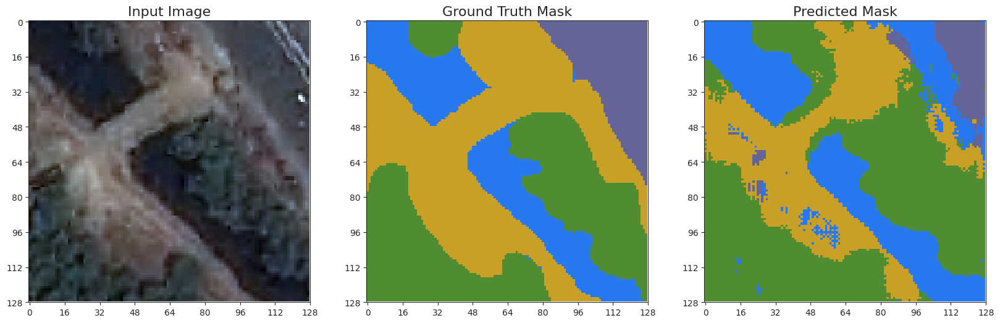

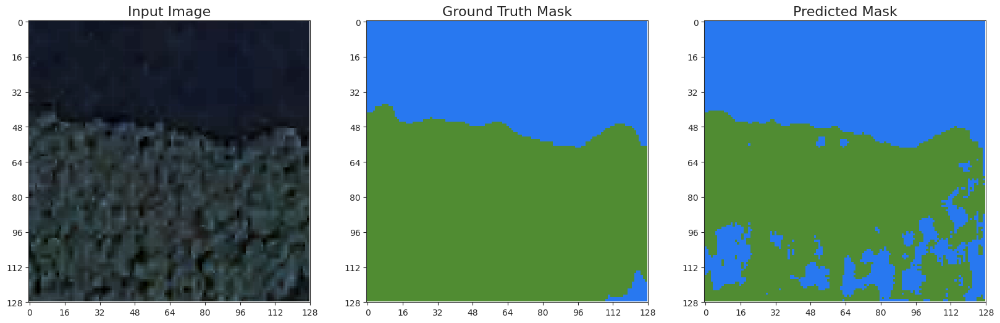

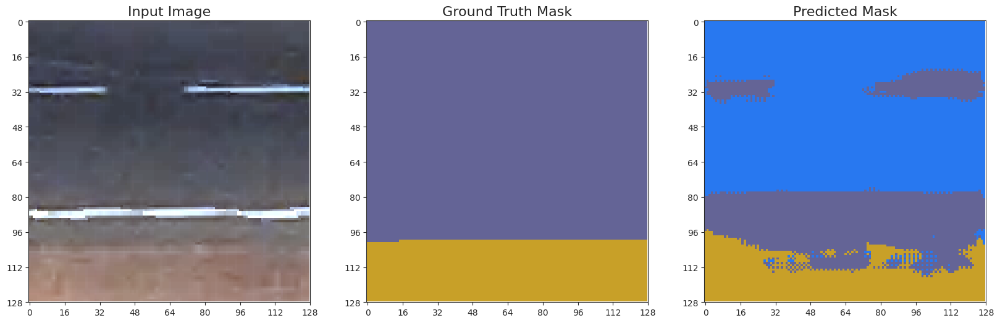

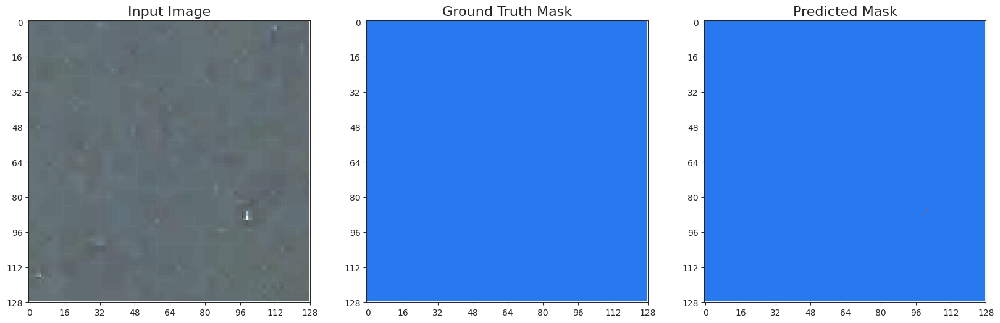

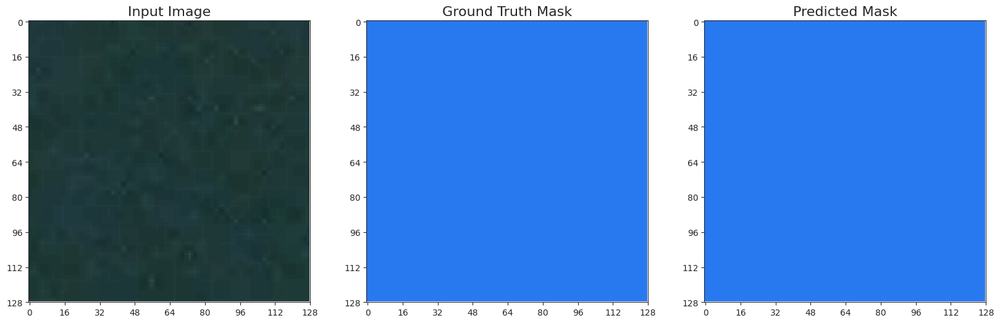

1/1 [==============================] - 0s 24ms/step


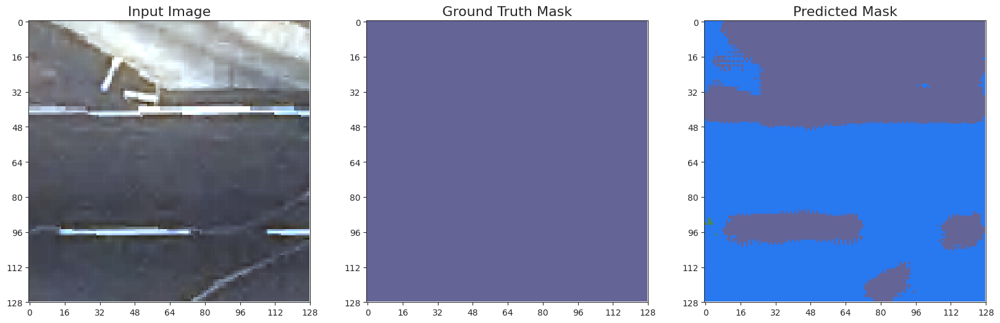

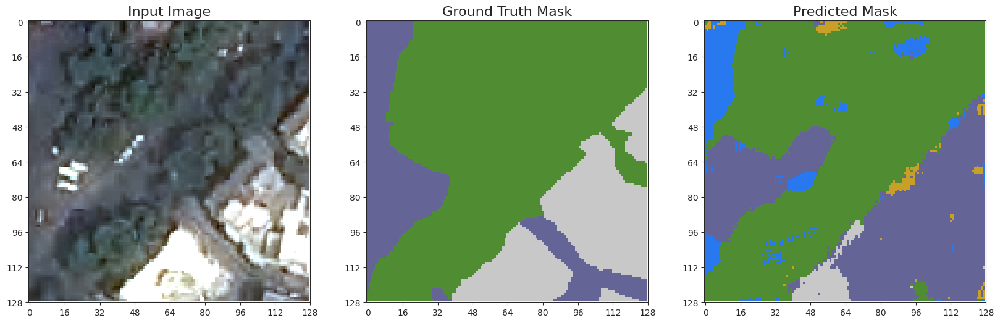

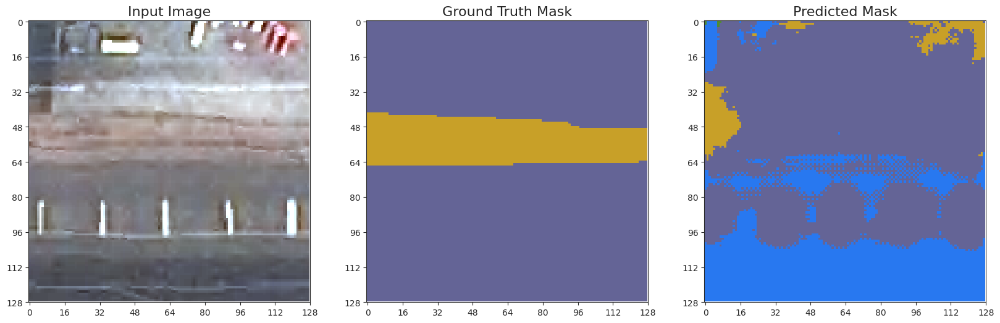

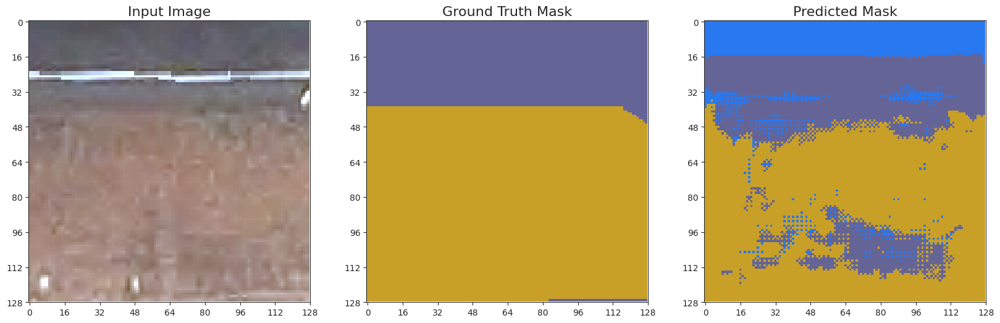

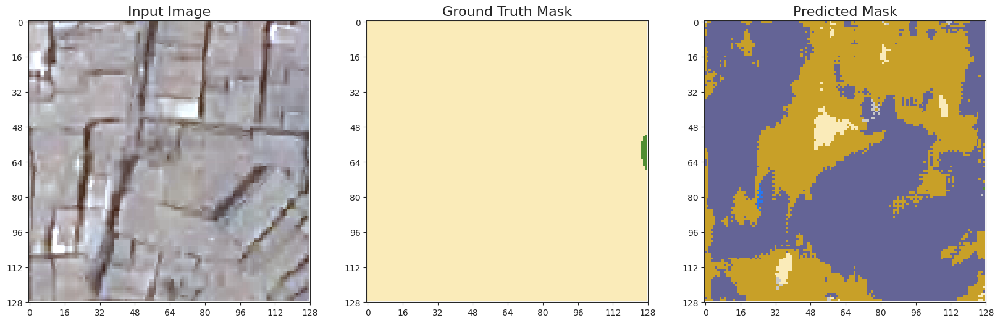

...

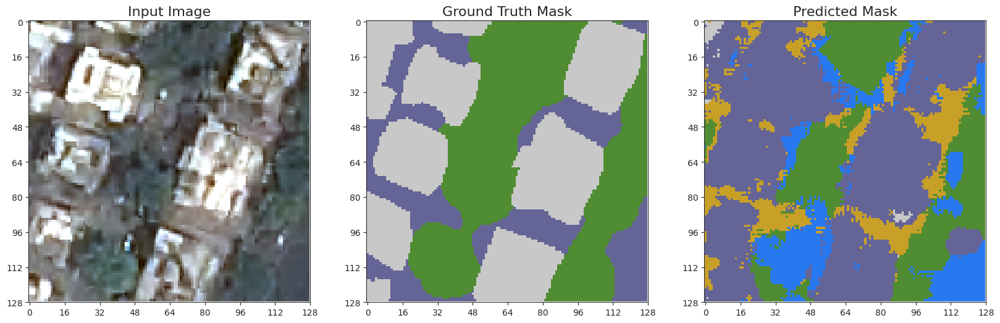

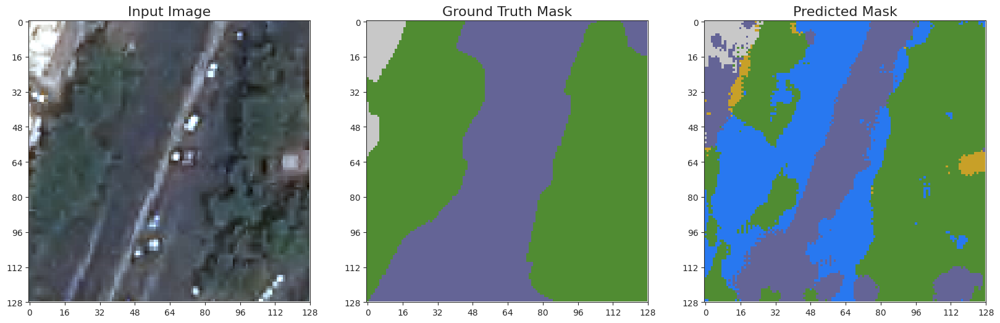

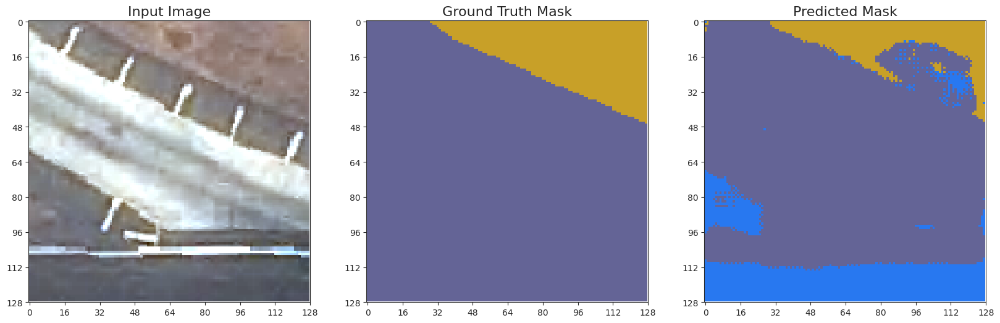

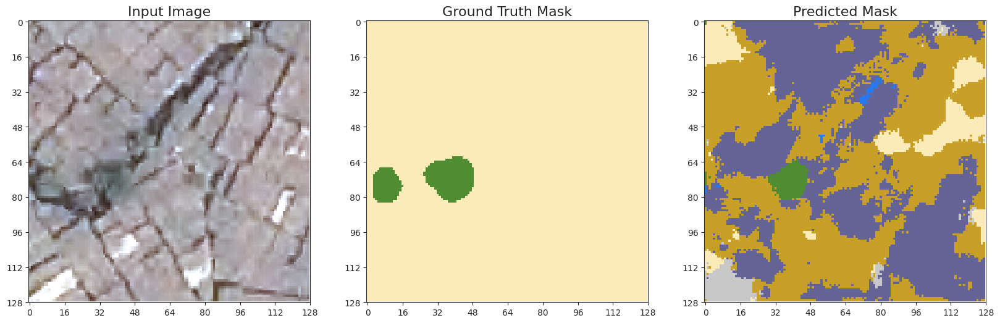

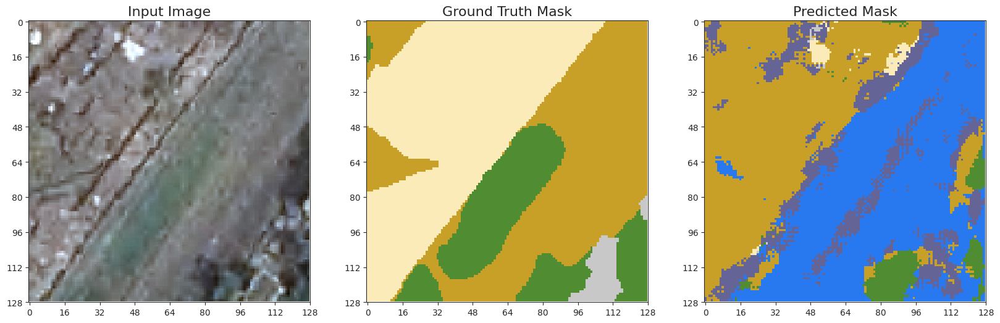

1/1 [==============================] - 0s 21ms/step


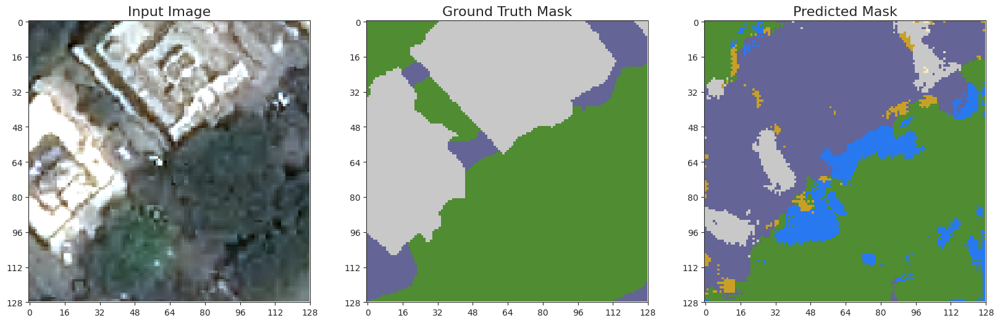

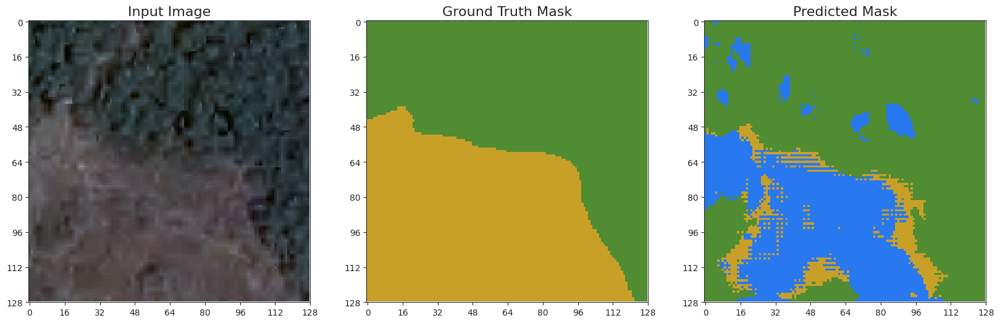

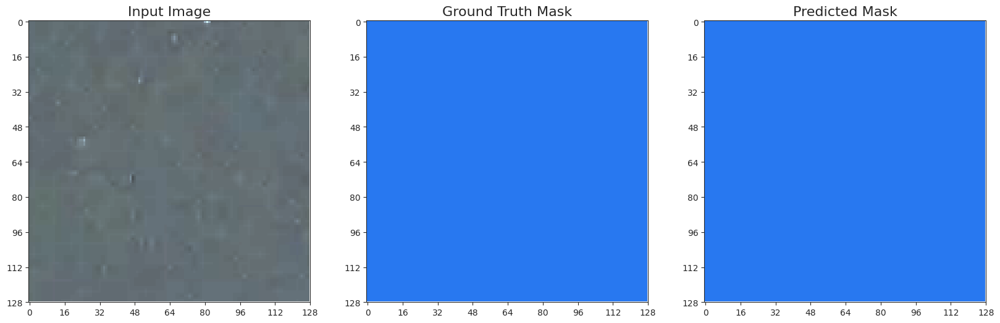

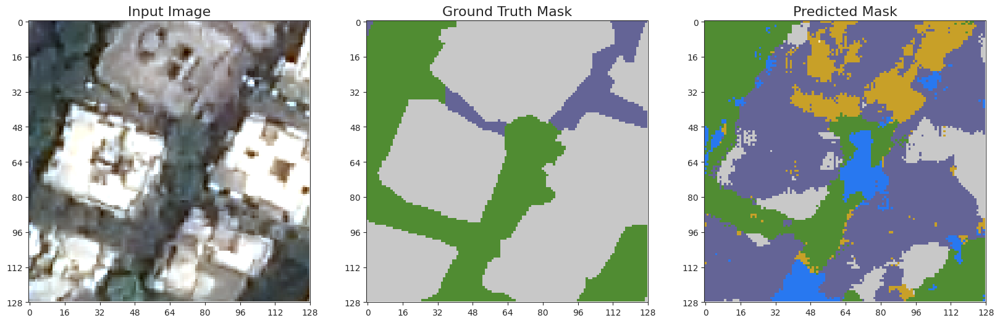

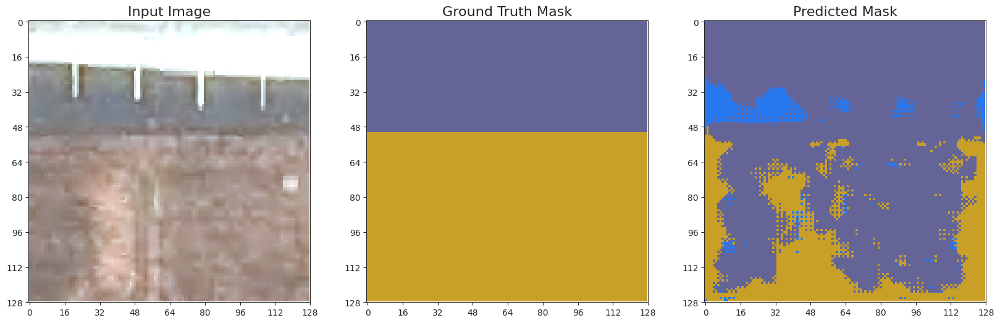

...

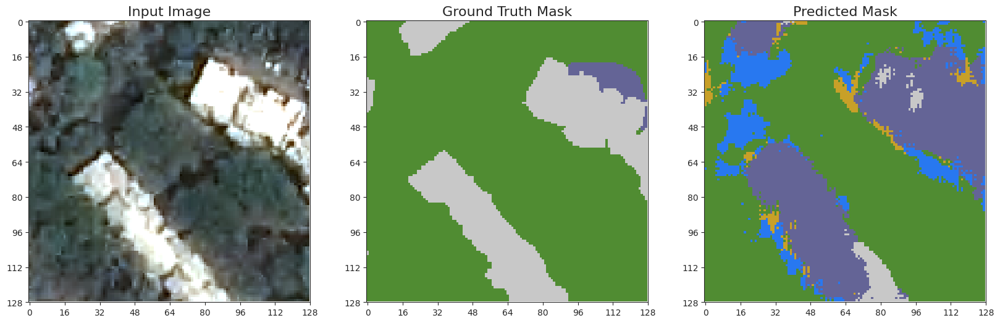

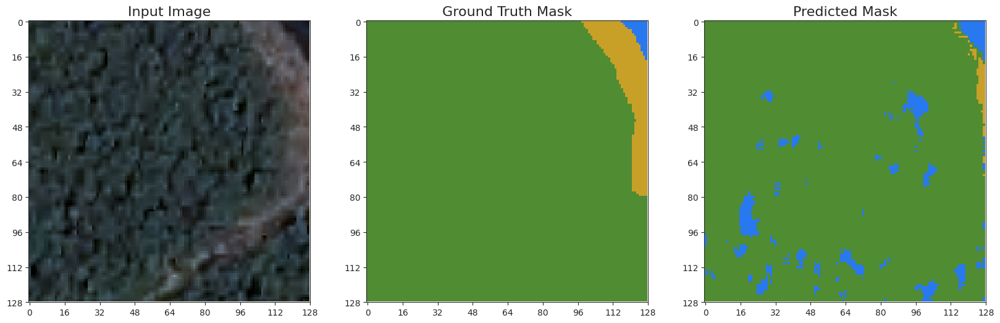

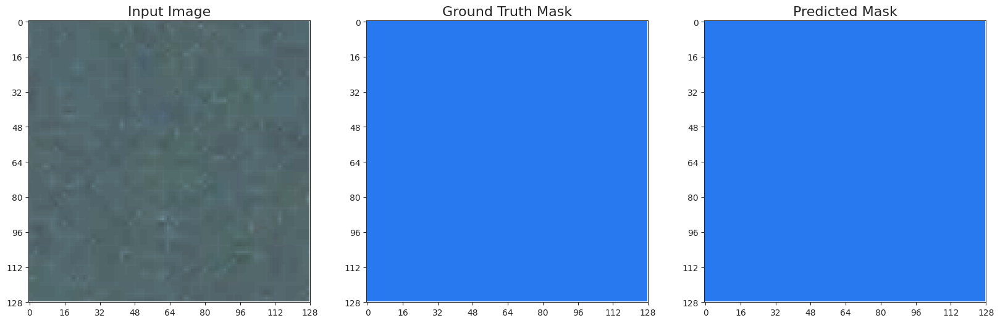

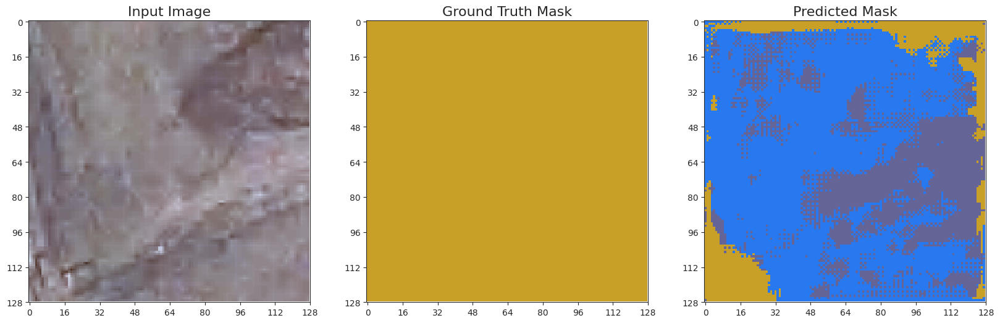

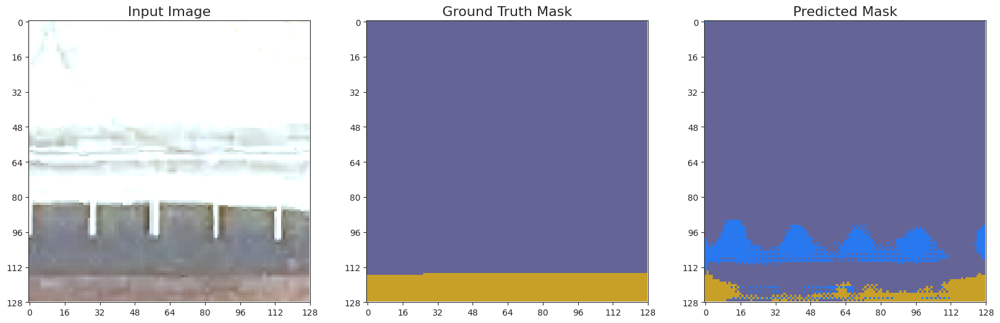

1/1 [==============================] - 0s 24ms/step


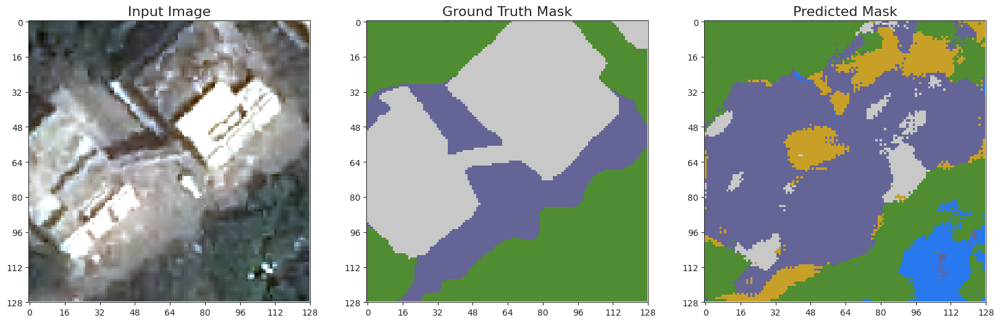

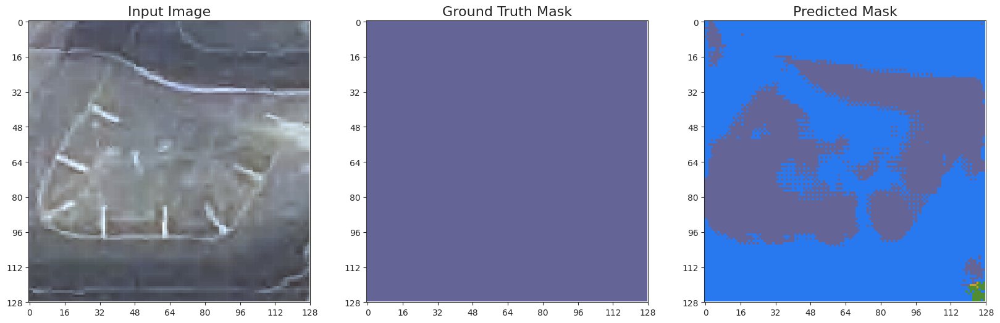

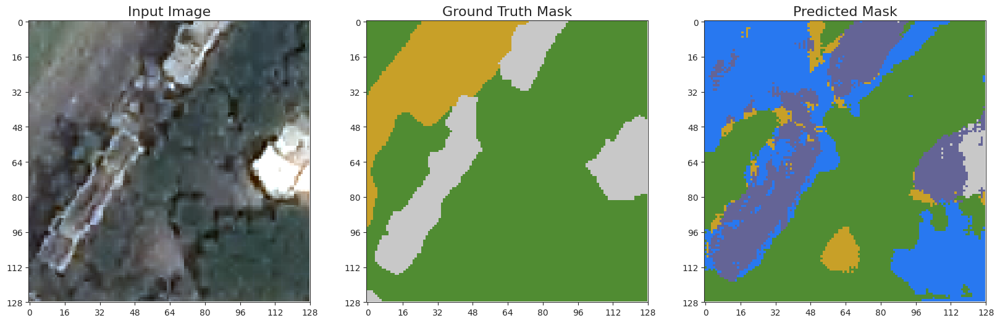

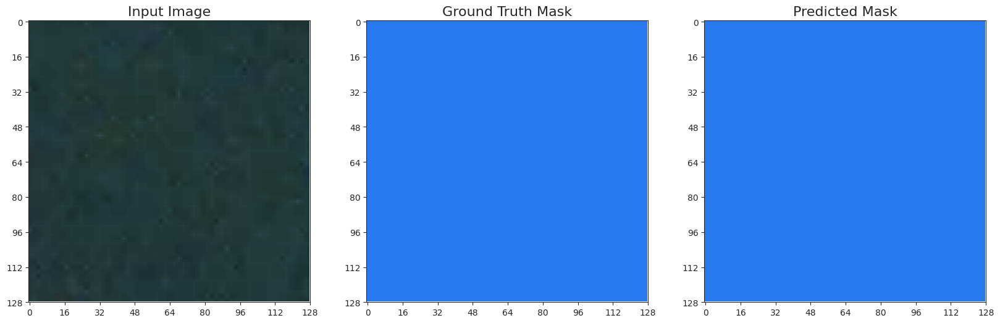

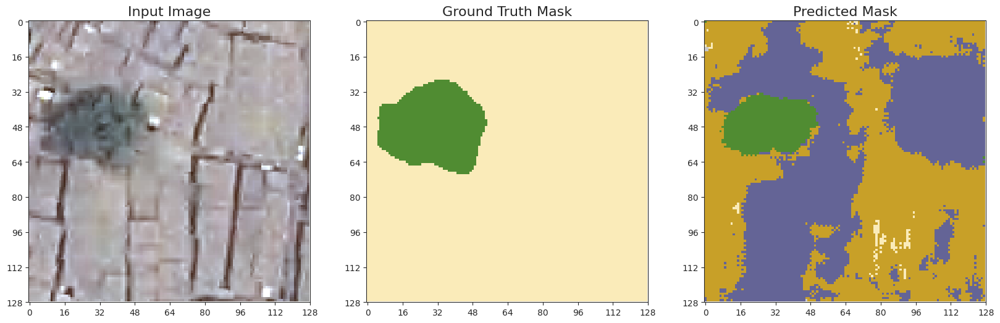

...

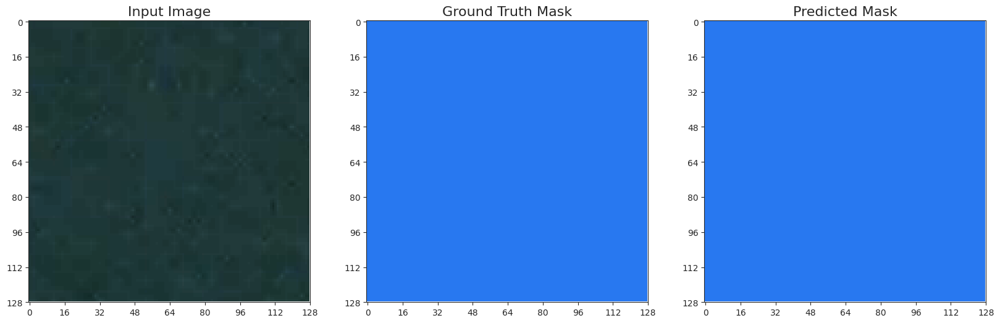

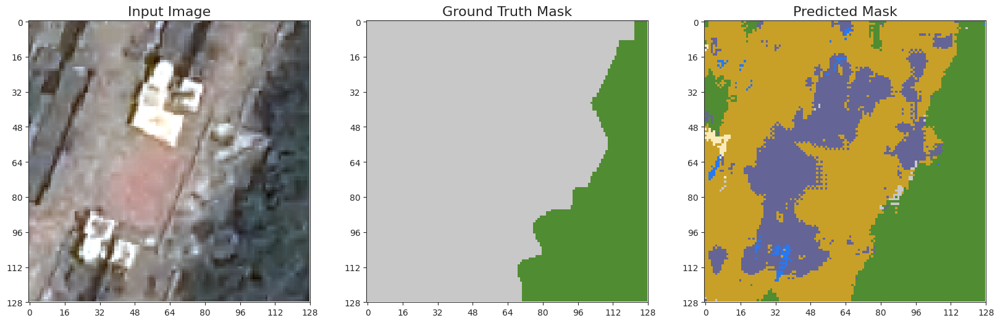

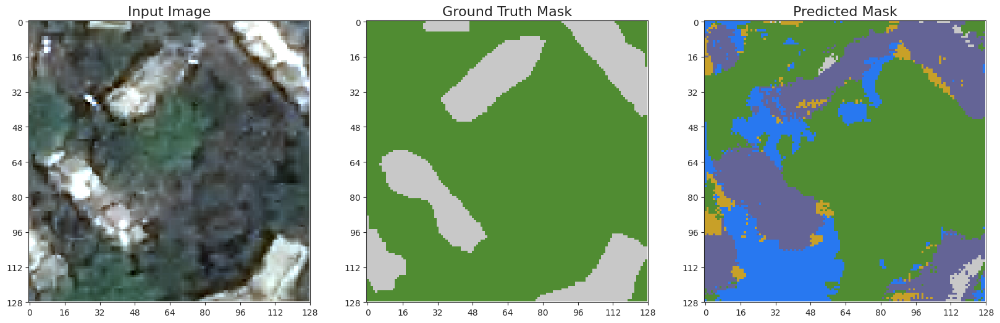

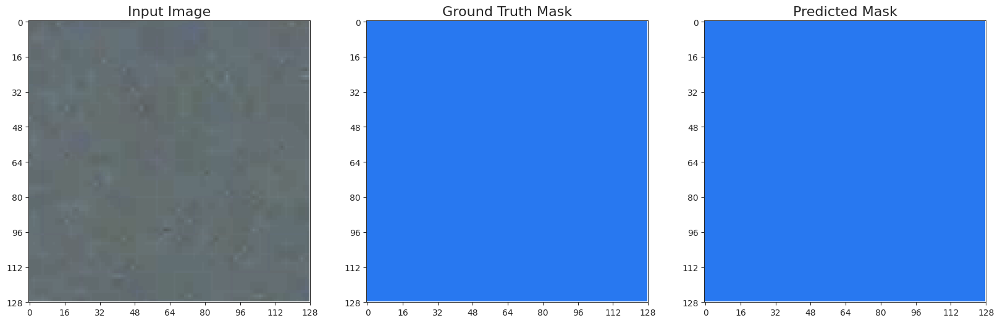

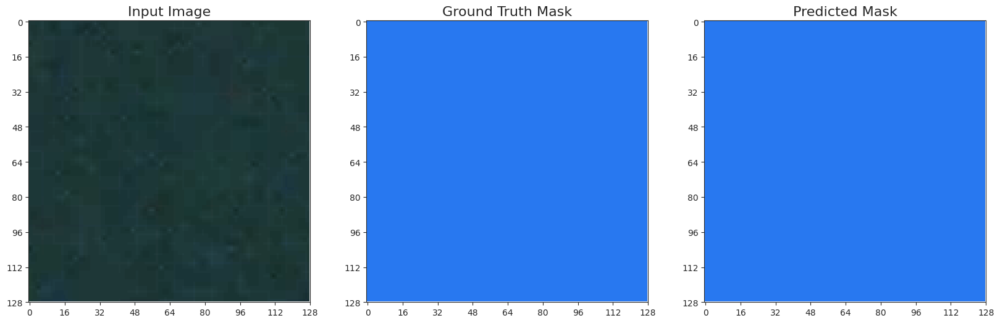

In [51]:
count = 0
for i in range(5):
    batch_img,batch_mask = next(testing_gen)
    pred_all= vgg16_unet.predict(batch_img)
    numpy.shape(pred_all)
    
    for j in range(0, numpy.shape(pred_all)[0]):
        count += 1
        fig = pyplot.figure(figsize=(20,8))

        ax1 = fig.add_subplot(1,3,1)
        ax1.imshow(batch_img[j])
        # cv2.imwrite(f'./Output/vgg16_unet_pred/{count}_img.tif', cv2.cvtColor(batch_img[j], cv2.COLOR_BGR2RGB))
        pyplot.imsave(f'/kaggle/working/vgg16_unet_pred/{count}_img.png', batch_img[j])
        # tifi.imsave(f'/kaggle/working/vgg16_unet_pred/{count}_img.tif', batch_img[j])
        # cv2.imwrite(f'/kaggle/working/vgg16_unet_pred/{count}_img.png', cv2.convertScaleAbs(batch_img[j], alpha=(255.0)))
        ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax1.set_xticks(numpy.arange(0, 129, 16))
        ax1.set_yticks(numpy.arange(0, 129, 16))
        ax1.grid(False)

        ax2 = fig.add_subplot(1,3,2)
        ax2.set_title('Ground Truth Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax2.imshow(onehot_to_rgb(batch_mask[j],id2code))
        cv2.imwrite(f'/kaggle/working/vgg16_unet_pred/{count}_gt.png', cv2.cvtColor(onehot_to_rgb(batch_mask[j],id2code), cv2.COLOR_BGR2RGB))
        ax2.set_xticks(numpy.arange(0, 129, 16))
        ax2.set_yticks(numpy.arange(0, 129, 16))
        ax2.grid(False)

        ax3 = fig.add_subplot(1,3,3)
        ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax3.imshow(onehot_to_rgb(pred_all[j],id2code))
        cv2.imwrite(f'/kaggle/working/vgg16_unet_pred/{count}_pred.png', cv2.cvtColor(onehot_to_rgb(pred_all[j],id2code), cv2.COLOR_BGR2RGB))
        ax3.set_xticks(numpy.arange(0, 129, 16))
        ax3.set_yticks(numpy.arange(0, 129, 16))
        ax3.grid(False)

        # pyplot.savefig('./Output/vgg16_unet_pred/vgg16_unet_pred_{}.png'.format(count), facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 200)
        pyplot.show()